In [27]:
from numpy.random import default_rng

rng = default_rng()
randnras = rng.choice(210,size=200,replace=False)
randpdgfb2 = rng.choice(204,size=200,replace=False)
randpdgfb3 = rng.choice(307,size=200,replace=False)

print(randnras)
print(randpdgfb2)
print(randpdgfb3)

[ 59   1 198  21  62 147  87 189   6 128 196 199 131  46 190  12  45 157
 150 140 153 119 121 164 142  26  83 114 178  48 169  68 168 109 120 123
 110 108 188  42  22 172  19 207 129 112 206  17  49  81  43 204 194  96
  98  37 162  13 167 205  50 183  34 185  65 154 182  66  16  24 200  33
   7  93  10  25  54 152   4 197 177  77  31  60  72  51 113 146 102  35
 176  67 155  69  47  36 135 209 132 201 145 106 203  29  30 184  75  80
 116 100 124  73 173 139 202  71 101 161   9  64 159 181 174  27  91  58
 103 136  38  32   2 195  55  15  84 193  23  95  39  79  97  18 180 141
  94 171 186 148 160   3   5 111 191 158  99 143  82 105  76 107  40  86
  53  57 151 179 117 104  92 156 170 149 127   0 137 115  78 138  89  44
  61  90  85 144  74 125  11 192 126  56  63 133 175  52  41 187 165 208
  28  14]
[203  77 135 195  25  87 133   5 121 174  45 104 191 140 111   9 123 154
 167  47 128  90  58 109  20  38 197 145 181  78 170  18 190 120  82   3
  55  67   8 201  86  56  69  63 155  21 

In [28]:
import pandas as pd
import numpy as np
from tifffile import tifffile as tiff

with open('G:\\MNtissueproject\\nras_0417_0422_both_photons\\matchednras_tumorarea.txt', 'r') as f1:
    lines1 = f1.readlines()
print(lines1[1:])
photonsnras = []
for files in lines1[1:]:
    photonsnras.append(files)
print(len(photonsnras))

with open('G:\\MNtissueproject\\pdgfb_take2_photons\\matchedpdgfb2_tumorarea.txt', 'r') as f1:
    lines1 = f1.readlines()
print(lines1[1:])
photonspdgfb2 = []
for files in lines1[1:]:
    photonspdgfb2.append(files)
print(len(photonspdgfb2))

with open('G:\\MNtissueproject\\pdgfb_take3_photons\\matchedpdgfb3_tumorarea.txt', 'r') as f1:
    lines1 = f1.readlines()
print(lines1[1:])
photonspdgfb3 = []
for files in lines1[1:]:
    photonspdgfb3.append(files)
print(len(photonspdgfb3))

with open('G:\\MNtissueproject\\nras_both_refit_ccv\\matchednras_tumorarea_ccvcorrect.txt', 'r') as f1:
    lines1 = f1.readlines()
print(lines1[1:])
ccvnras = []
for files in lines1[1:]:
    ccvnras.append(files)
print(len(ccvnras))

with open('G:\\MNtissueproject\\pdgfb_take2_ccv\\matchedpdgfb2_tumorarea.txt', 'r') as f1:
    lines1 = f1.readlines()
#print(lines1[1:])
ccvpdgfb2 = []
for files in lines1[1:]:
    ccvpdgfb2.append(files)
print(len(ccvpdgfb2))

with open('G:\\MNtissueproject\\pdgfb_take3_ccv\\matchedpdgfb3_tumorarea_ccv.txt', 'r') as f1:
    lines1 = f1.readlines()
#print(lines1[1:])
ccvpdgfb3 = []
for files in lines1[1:]:
    ccvpdgfb3.append(files)
print(len(ccvpdgfb3))


locp = ['G:\\MNtissueproject\\nras_0417_0422_both_photons\\','G:\\MNtissueproject\\pdgfb_take2_photons\\','G:\\MNtissueproject\\pdgfb_take3_photons\\']
locccv = ['G:\\MNtissueproject\\nras_both_refit_ccv\\','G:\\MNtissueproject\\pdgfb_take2_ccv\\','G:\\MNtissueproject\\pdgfb_take3_ccv\\']
dataout = pd.DataFrame()
for i in randnras:
    photonsim = photonsnras[i]
    imname = photonsim.split(';')
    #print(imname)
    print(f"{locp}{imname[0]}")
    photonimage = np.array(tiff.imread(f"{locp[0]}{imname[0]}"))
    print({'nras':np.nanmean(photonimage[photonimage>0])})
    

    ccvim = ccvnras[i]
    ccvimname = ccvim.split(';')
    #print(imname)
    print(f"{locccv}{ccvimname[0]}")
    ccvimage = np.array(tiff.imread(f"{locccv[0]}{ccvimname[0]}"))
    print({'nras':np.nanmean(ccvimage[ccvimage>0])})
    
    photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
    ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
    fnum = np.divide(ccvcv,photoncv)
    d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'nras'})
    dataout = pd.concat([dataout,d],ignore_index=True)

for i in randpdgfb2:
    photonsim = photonspdgfb2[i]
    imname = photonsim.split(';')
    #print(imname)
    print(f"{locp}{imname[0]}")
    photonimage = np.array(tiff.imread(f"{locp[1]}{imname[0]}"))
    
    ccvim = ccvpdgfb2[i]
    ccvimname = ccvim.split(';')
    #print(imname)
    print(f"{locccv}{ccvimname[0]}")
    ccvimage = np.array(tiff.imread(f"{locccv[1]}{ccvimname[0]}"))
    photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
    ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
    fnum = np.divide(ccvcv,photoncv)
    d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'pdgfb2'})
    dataout = pd.concat([dataout,d],ignore_index=True)

for i in randpdgfb3:
    photonsim = photonspdgfb3[i]
    imname = photonsim.split(';')
    #print(imname)
    print(f"{locp}{imname[0]}")
    photonimage = np.array(tiff.imread(f"{locp[2]}{imname[0]}"))
    

    ccvim = ccvpdgfb3[i]
    ccvimname = ccvim.split(';')
    #print(imname)
    print(f"{locccv}{ccvimname[0]}")
    ccvimage = np.array(tiff.imread(f"{locccv[2]}{ccvimname[0]}"))
    photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
    ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
    fnum = np.divide(ccvcv,photoncv)
    d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'pdgfb3'})
    dataout = pd.concat([dataout,d],ignore_index=True)


dataout

['Hflipped_pos_0082_photons.tif; ; (-5673.9694,-7441.7789)\n', 'Hflipped_pos_0083_photons.tif; ; (-5917.1237,-7441.7789)\n', 'Hflipped_pos_0084_photons.tif; ; (-6160.2779,-7441.7789)\n', 'Hflipped_pos_0085_photons.tif; ; (-6403.4322,-7441.7789)\n', 'Hflipped_pos_0086_photons.tif; ; (-6646.5865,-7441.7789)\n', 'Hflipped_pos_0087_photons.tif; ; (-6889.7408,-7441.7789)\n', 'Hflipped_pos_0088_photons.tif; ; (-7132.8951,-7441.7789)\n', 'Hflipped_pos_0089_photons.tif; ; (-7376.0493,-7441.7789)\n', 'Hflipped_pos_0130_photons.tif; ; (-8348.6664,-7198.6246)\n', 'Hflipped_pos_0131_photons.tif; ; (-8105.5122,-7198.6246)\n', 'Hflipped_pos_0132_photons.tif; ; (-7862.3579,-7198.6246)\n', 'Hflipped_pos_0133_photons.tif; ; (-7619.2036,-7198.6246)\n', 'Hflipped_pos_0134_photons.tif; ; (-7376.0493,-7198.6246)\n', 'Hflipped_pos_0135_photons.tif; ; (-7132.8951,-7198.6246)\n', 'Hflipped_pos_0136_photons.tif; ; (-6889.7408,-7198.6246)\n', 'Hflipped_pos_0137_photons.tif; ; (-6646.5865,-7198.6246)\n', 'Hflipp

,lifetimemean,ccvcv,fnum,photonsmean,tissue
0,874.662170,0.134751,0.387401,54.823822,nras
1,843.028320,0.906455,0.808704,51.526836,nras
2,863.158691,1.442662,0.800376,15.229450,nras
3,893.905579,0.191831,0.470721,64.698837,nras
4,883.300171,0.144722,0.340527,50.963451,nras
...,...,...,...,...,...
595,1046.246094,0.134070,0.288017,48.598282,pdgfb3
596,985.092041,0.132696,0.273209,53.870392,pdgfb3
597,987.874756,0.125844,0.359431,54.333984,pdgfb3
598,1028.037598,0.132854,0.315007,51.490753,pdgfb3


949.2995 68.75091 0.17741646 0.18061246 0.37674698 0.11391968 53.89996 12.211462


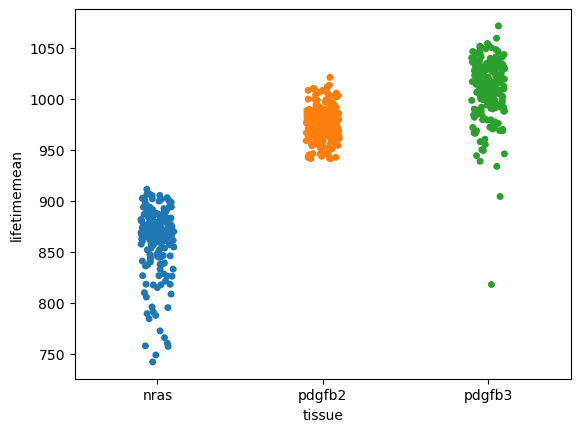

In [29]:
import seaborn as sns

sns.stripplot(data=dataout,x="tissue",y="lifetimemean", hue = "tissue")
#sns.stripplot(data=dataout,x="tissue",y="photonsmean")
#sns.stripplot(data=dataout,x="tissue",y="fnum")
print(
dataout['lifetimemean'].mean(),
dataout['lifetimemean'].std(),
dataout['ccvcv'].mean(),
dataout['ccvcv'].std(),
dataout['fnum'].mean(),
dataout['fnum'].std(),
dataout['photonsmean'].mean(),
dataout['photonsmean'].std())

In [94]:
import scipy.stats as stat
import pandas as pd
import numpy as np
from tifffile import tifffile as tiff
from numpy.random import default_rng


s = [3, 5, 10, 20,30,40, 50,60,70,80,90,100]
rerun = [1,2,3,4,5,6,7,8,9,10]

wddata = pd.DataFrame()
for y in rerun: 
    for x in s:
        rng = default_rng()
        randnras = rng.choice(210,size=x,replace=False)
        randpdgfb2 = rng.choice(204,size=x,replace=False)
        randpdgfb3 = rng.choice(307,size=x,replace=False)

        print(randnras)
        print(randpdgfb2)
        print(randpdgfb3)



        with open('G:\\MNtissueproject\\nras_0417_0422_both_photons\\matchednras_tumorarea.txt', 'r') as f1:
            lines1 = f1.readlines()
        print(lines1[1:])
        photonsnras = []
        for files in lines1[1:]:
            photonsnras.append(files)
        print(len(photonsnras))

        with open('G:\\MNtissueproject\\pdgfb_take2_photons\\matchedpdgfb2_tumorarea.txt', 'r') as f1:
            lines1 = f1.readlines()
        print(lines1[1:])
        photonspdgfb2 = []
        for files in lines1[1:]:
            photonspdgfb2.append(files)
        print(len(photonspdgfb2))

        with open('G:\\MNtissueproject\\pdgfb_take3_photons\\matchedpdgfb3_tumorarea.txt', 'r') as f1:
            lines1 = f1.readlines()
        print(lines1[1:])
        photonspdgfb3 = []
        for files in lines1[1:]:
            photonspdgfb3.append(files)
        print(len(photonspdgfb3))

        with open('G:\\MNtissueproject\\nras_both_refit_ccv\\matchednras_tumorarea_ccvcorrect.txt', 'r') as f1:
            lines1 = f1.readlines()
        print(lines1[1:])
        ccvnras = []
        for files in lines1[1:]:
            ccvnras.append(files)
        print(len(ccvnras))

        with open('G:\\MNtissueproject\\pdgfb_take2_ccv\\matchedpdgfb2_tumorarea.txt', 'r') as f1:
            lines1 = f1.readlines()
        #print(lines1[1:])
        ccvpdgfb2 = []
        for files in lines1[1:]:
            ccvpdgfb2.append(files)
        print(len(ccvpdgfb2))

        with open('G:\\MNtissueproject\\pdgfb_take3_ccv\\matchedpdgfb3_tumorarea_ccv.txt', 'r') as f1:
            lines1 = f1.readlines()
        #print(lines1[1:])
        ccvpdgfb3 = []
        for files in lines1[1:]:
            ccvpdgfb3.append(files)
        print(len(ccvpdgfb3))


        locp = ['G:\\MNtissueproject\\nras_0417_0422_both_photons\\','G:\\MNtissueproject\\pdgfb_take2_photons\\','G:\\MNtissueproject\\pdgfb_take3_photons\\']
        locccv = ['G:\\MNtissueproject\\nras_both_refit_ccv\\','G:\\MNtissueproject\\pdgfb_take2_ccv\\','G:\\MNtissueproject\\pdgfb_take3_ccv\\']
        dataout = pd.DataFrame()
        for i in randnras:
            photonsim = photonsnras[i]
            imname = photonsim.split(';')
            #print(imname)
            print(f"{locp}{imname[0]}")
            photonimage = np.array(tiff.imread(f"{locp[0]}{imname[0]}"))
            print({'nras':np.nanmean(photonimage[photonimage>0])})
            

            ccvim = ccvnras[i]
            ccvimname = ccvim.split(';')
            #print(imname)
            print(f"{locccv}{ccvimname[0]}")
            ccvimage = np.array(tiff.imread(f"{locccv[0]}{ccvimname[0]}"))
            print({'nras':np.nanmean(ccvimage[ccvimage>0])})
            
            photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
            ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
            fnum = np.divide(ccvcv,photoncv)
            d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'nras'})
            dataout = pd.concat([dataout,d],ignore_index=True)

        for i in randpdgfb2:
            photonsim = photonspdgfb2[i]
            imname = photonsim.split(';')
            #print(imname)
            print(f"{locp}{imname[0]}")
            photonimage = np.array(tiff.imread(f"{locp[1]}{imname[0]}"))
            
            ccvim = ccvpdgfb2[i]
            ccvimname = ccvim.split(';')
            #print(imname)
            print(f"{locccv}{ccvimname[0]}")
            ccvimage = np.array(tiff.imread(f"{locccv[1]}{ccvimname[0]}"))
            photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
            ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
            fnum = np.divide(ccvcv,photoncv)
            d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'pdgfb2'})
            dataout = pd.concat([dataout,d],ignore_index=True)

        for i in randpdgfb3:
            photonsim = photonspdgfb3[i]
            imname = photonsim.split(';')
            #print(imname)
            print(f"{locp}{imname[0]}")
            photonimage = np.array(tiff.imread(f"{locp[2]}{imname[0]}"))
            

            ccvim = ccvpdgfb3[i]
            ccvimname = ccvim.split(';')
            #print(imname)
            print(f"{locccv}{ccvimname[0]}")
            ccvimage = np.array(tiff.imread(f"{locccv[2]}{ccvimname[0]}"))
            photoncv = np.nanstd(photonimage)/np.nanmean(photonimage)
            ccvcv = np.nanstd(ccvimage)/np.nanmean(ccvimage)
            fnum = np.divide(ccvcv,photoncv)
            d = pd.DataFrame({"lifetimemean": [np.nanmean(ccvimage[ccvimage>0])],"ccvcv":ccvcv,"fnum":fnum,"photonsmean": [np.nanmean(photonimage[photonimage>0])],'tissue':'pdgfb3'})
            dataout = pd.concat([dataout,d],ignore_index=True)



        nras = dataout[dataout['tissue']=='nras']
        pdgfb2 = dataout[dataout['tissue']=='pdgfb2']
        pdgfb3 = dataout[dataout['tissue']=='pdgfb3']




        print(stat.wasserstein_distance(nras['lifetimemean'],pdgfb2['lifetimemean']))
        n_p2 = pd.DataFrame({"comp": ["n_p2"], "size": [x],"wd":[stat.wasserstein_distance(nras['lifetimemean'],pdgfb2['lifetimemean'])]})
        n_p3 = pd.DataFrame({"comp": ["n_p3"], "size": [x], "wd": [stat.wasserstein_distance(nras['lifetimemean'],pdgfb3['lifetimemean'])]})
        p2_p3 = pd.DataFrame({"comp": ["p2_p3"], "size": [x], "wd": [stat.wasserstein_distance(pdgfb2['lifetimemean'], pdgfb3['lifetimemean'])]})

        wddata = pd.concat([wddata, n_p2,n_p3,p2_p3],ignore_index=True)
        

print(wddata.head())





[179 157 192]
[120 201 125]
[184 251  41]
['Hflipped_pos_0082_photons.tif; ; (-5673.9694,-7441.7789)\n', 'Hflipped_pos_0083_photons.tif; ; (-5917.1237,-7441.7789)\n', 'Hflipped_pos_0084_photons.tif; ; (-6160.2779,-7441.7789)\n', 'Hflipped_pos_0085_photons.tif; ; (-6403.4322,-7441.7789)\n', 'Hflipped_pos_0086_photons.tif; ; (-6646.5865,-7441.7789)\n', 'Hflipped_pos_0087_photons.tif; ; (-6889.7408,-7441.7789)\n', 'Hflipped_pos_0088_photons.tif; ; (-7132.8951,-7441.7789)\n', 'Hflipped_pos_0089_photons.tif; ; (-7376.0493,-7441.7789)\n', 'Hflipped_pos_0130_photons.tif; ; (-8348.6664,-7198.6246)\n', 'Hflipped_pos_0131_photons.tif; ; (-8105.5122,-7198.6246)\n', 'Hflipped_pos_0132_photons.tif; ; (-7862.3579,-7198.6246)\n', 'Hflipped_pos_0133_photons.tif; ; (-7619.2036,-7198.6246)\n', 'Hflipped_pos_0134_photons.tif; ; (-7376.0493,-7198.6246)\n', 'Hflipped_pos_0135_photons.tif; ; (-7132.8951,-7198.6246)\n', 'Hflipped_pos_0136_photons.tif; ; (-6889.7408,-7198.6246)\n', 'Hflipped_pos_0137_photons.

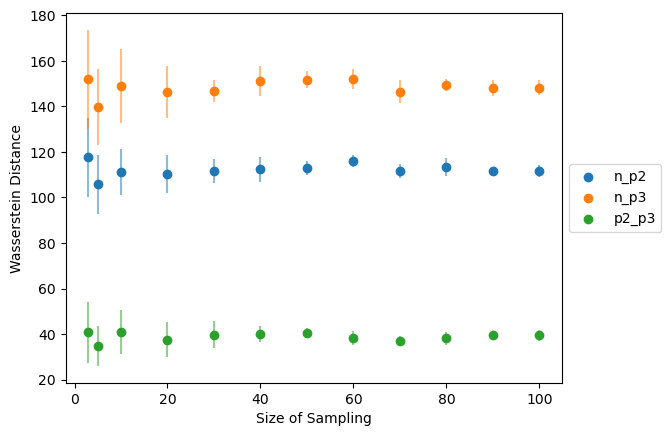

In [95]:
color_map = {comp: idx for idx, comp in enumerate(wddata['comp'].unique())}
wddata['color'] = wddata['comp'].map(color_map)

# Create a set to track added labels
added_labels = set()

# Create a colormap
cmap = plt.cm.tab10

for sz in wddata['size'].unique():
    for comp in wddata['comp'].unique():
        subset = wddata[(wddata['comp'] == comp) & (wddata['size'] == sz)]
        
        # Get the color from the colormap
        color = cmap(color_map[comp] % cmap.N)  # Ensure the index is within range
        
        # Plotting the scatter and error bars
        plt.scatter(np.mean(subset['size']), np.mean(subset['wd']), 
                    color=color, alpha=1)
        plt.errorbar(x=np.mean(subset['size']), y=np.mean(subset['wd']), yerr=np.std(subset['wd']), 
                     color=color, alpha=0.5)
        
        # Add label to the legend only if it hasn't been added before
        if comp not in added_labels:
            plt.scatter([], [], color=color, label=comp)  # Dummy scatter for legend
            added_labels.add(comp)

plt.xlabel('Size of Sampling')
plt.ylabel('Wasserstein Distance')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [50]:
stat.wasserstein_distance([1,1,1],[3,2,2])

np.float64(1.3333333333333335)